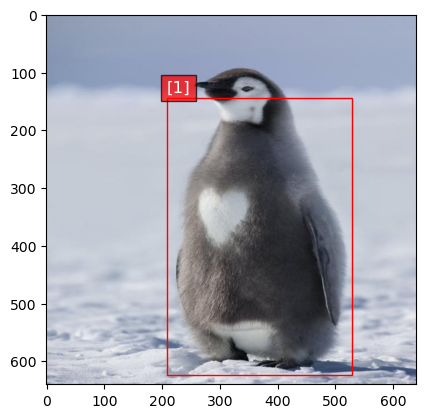

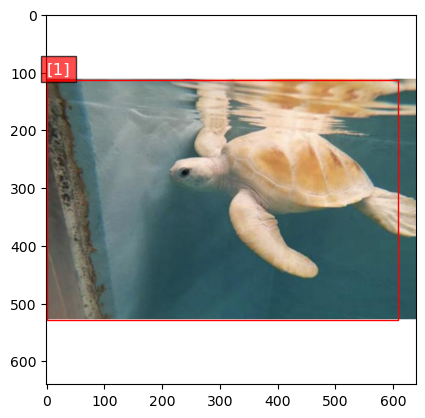

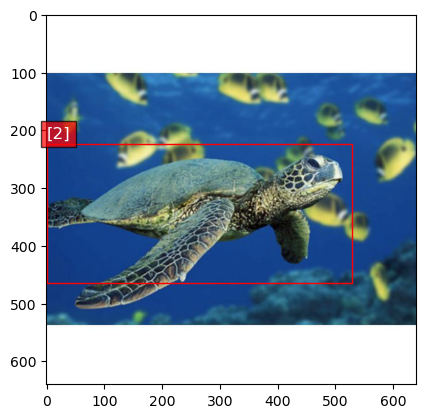

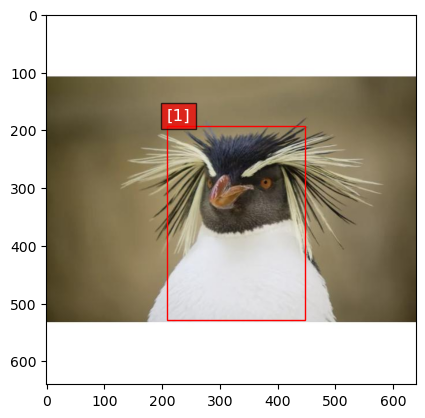

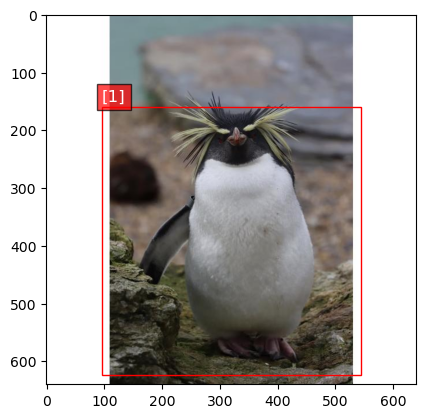

...

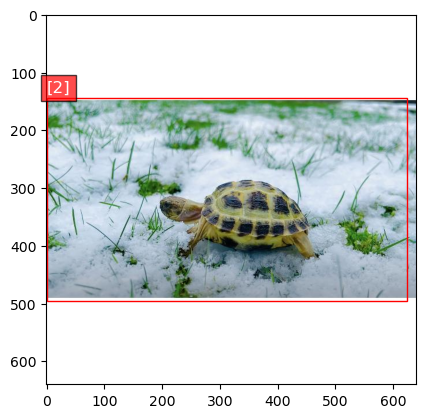

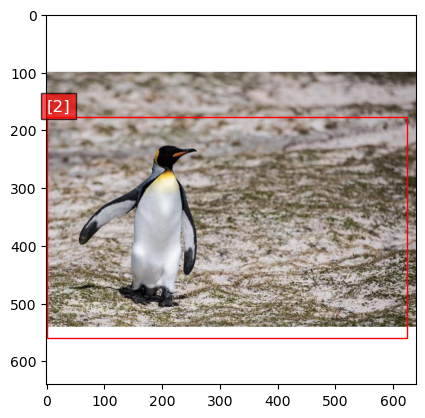

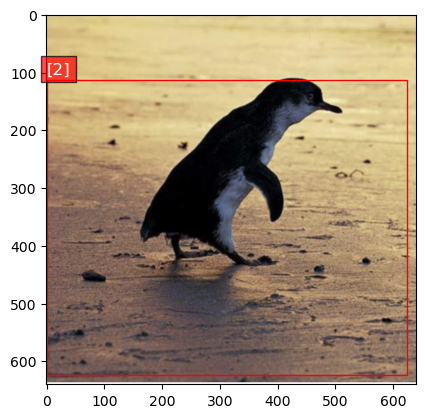

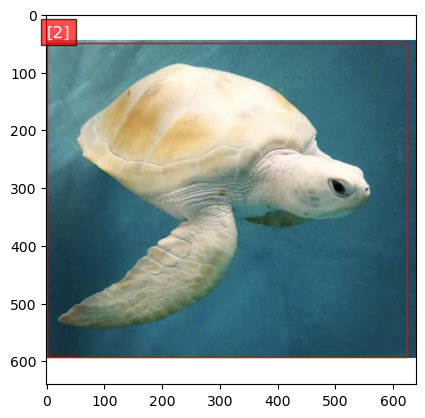

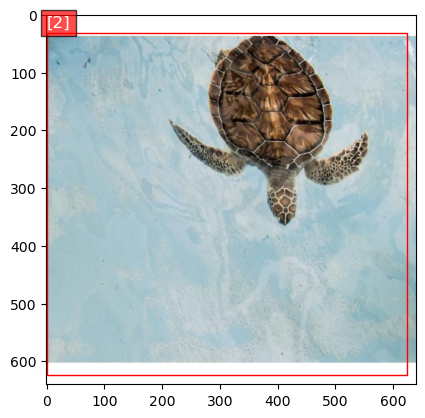

Mean distance: 198.4442344679573
Standard deviation of distances: 98.03985534635784
Mean IoU: 0.018393290556503038
Standard deviation of IoUs: 0.024768174217085773
              precision    recall  f1-score   support

           1       0.70      0.53      0.60        36
           2       0.62      0.78      0.69        36

    accuracy                           0.65        72
   macro avg       0.66      0.65      0.65        72
weighted avg       0.66      0.65      0.65        72

Confusion Matrix: 
[[19 17]
 [ 8 28]]
Accuracy: 0.6527777777777778
Precision: 0.662962962962963
Recall: 0.6527777777777778
F1 Score: 0.6472663139329806


In [7]:
import cv2
from skimage.feature import hog
from sklearn import svm
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import json
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Function to calculate IoU
def bb_intersection_over_union(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)

    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

# Function for non-maximum suppression
def non_max_suppression(boxes, overlapThresh):
    if len(boxes) == 0:
        return []

    pick = []
    x1 = boxes[:,0]
    y1 = boxes[:,1]
    x2 = boxes[:,2]
    y2 = boxes[:,3]

    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)

    while len(idxs) > 0:
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)

        xx1 = np.maximum(x1[i], x1[idxs[:last]])
        yy1 = np.maximum(y1[i], y1[idxs[:last]])
        xx2 = np.minimum(x2[i], x2[idxs[:last]])
        yy2 = np.minimum(y2[i], y2[idxs[:last]])

        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)

        overlap = (w * h) / area[idxs[:last]]

        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlapThresh)[0])))

    return boxes[pick].astype("int")

# Load the annotations
with open('train_annotations') as f:
    train_annotations = json.load(f)
with open('valid_annotations') as f:
    valid_annotations = json.load(f)

# Initialize lists to hold features and labels
train_features = []
train_labels = []
valid_features = []
valid_labels = []

image_size = (64, 64)

# Extract HOG features from the training images
for annotation in train_annotations:
    # Load the image
    image = cv2.imread('train/train/image_id_' + str(annotation['image_id']).zfill(3) + '.jpg', cv2.IMREAD_GRAYSCALE)

    x_min, y_min, width, height = annotation['bbox']
    x_max = x_min + width
    y_max = y_min + height

    patch = image[y_min:y_max, x_min:x_max]

    resized_patch = cv2.resize(patch, image_size)

    features = hog(resized_patch, orientations=9, pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2), block_norm='L2-Hys')

    train_features.append(features)
    train_labels.append(annotation['category_id'])
    

clf = svm.SVC(probability=True)
clf.fit(train_features, train_labels)


window_size = (64, 64)
step_size = 16

distances = []
ious = []
valid_predictions = []

# Slide the window across each validation image
for annotation in valid_annotations:
    image = cv2.imread('valid/valid/image_id_' + str(annotation['image_id']).zfill(3) + '.jpg', cv2.IMREAD_GRAYSCALE)
    image_colour = cv2.imread('valid/valid/image_id_' + str(annotation['image_id']).zfill(3) + '.jpg')

    bounding_boxes = []


    resized_image = cv2.resize(image, (int(image.shape[1]), int(image.shape[0])))
    # slide the window across the resized image
    for y in range(0, resized_image.shape[0] - window_size[1], step_size):
        for x in range(0, resized_image.shape[1] - window_size[0], step_size):

            window = resized_image[y:y + window_size[1], x:x + window_size[0]]

            features = hog(window, orientations=9, pixels_per_cell=(8, 8),
                            cells_per_block=(2, 2), block_norm='L2-Hys')

            prediction_proba = clf.predict_proba([features])


            if prediction_proba[0][1] > 0.5:
                bounding_boxes.append((int(x), int(y), int(window_size[0]), int(window_size[1])))

    
    bounding_boxes = non_max_suppression(np.array(bounding_boxes), 0.3)


    fig, ax = plt.subplots(1)


    image_colour = cv2.cvtColor(image_colour, cv2.COLOR_BGR2RGB)

 
    ax.imshow(image_colour)

    x_min = min(bounding_boxes[:, 0])
    y_min = min(bounding_boxes[:, 1])
    x_max = max(bounding_boxes[:, 0] + bounding_boxes[:, 2])
    y_max = max(bounding_boxes[:, 1] + bounding_boxes[:, 3])

    roi = image[y_min:y_max, x_min:x_max]
    roi_resized = cv2.resize(roi, (64, 64))
    roi_features = hog(roi_resized, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), block_norm='L2-Hys')
    roi_prediction = clf.predict([roi_features])

    rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min, linewidth=1, edgecolor='r', facecolor='none')
    ax.add_patch(rect)


    plt.text(x_min, y_min - 10, str(roi_prediction), color='white', fontsize=12, bbox={'facecolor': 'red', 'alpha': 0.7})

    plt.show()

    centers = [(x + w / 2, y + h / 2) for x, y, w, h in bounding_boxes]

    x_min, y_min, width, height = annotation['bbox']
    x_max = x_min + width
    y_max = y_min + height
    true_center = (x_min + width / 2, y_min + height / 2)


    distances += [np.sqrt((x - true_center[0]) ** 2 + (y - true_center[1]) ** 2) for x, y in centers]

    ious += [bb_intersection_over_union((x, y, x + w, y + h), (x_min, y_min, x_max, y_max)) for x, y, w, h in bounding_boxes]

    valid_predictions.append(roi_prediction)

    valid_labels.append(annotation['category_id'])


print(f"Mean distance: {np.mean(distances)}")
print(f"Standard deviation of distances: {np.std(distances)}")
print(f"Mean IoU: {np.mean(ious)}")
print(f"Standard deviation of IoUs: {np.std(ious)}")


print(classification_report(valid_labels, valid_predictions))


confusion_mat = confusion_matrix(valid_labels, valid_predictions)
accuracy = accuracy_score(valid_labels, valid_predictions)
precision = precision_score(valid_labels, valid_predictions, average='macro')
recall = recall_score(valid_labels, valid_predictions, average='macro')
f1 = f1_score(valid_labels, valid_predictions, average='macro')

print(f"Confusion Matrix: \n{confusion_mat}")
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")